In [ ]:
#!git clone https://github.com/aixiajiao/satesr.git
#%cd satesr

In [ ]:
#!python setup.py

In [12]:
import time
download_folder = 'temp/aerialimgs/{}'.format(time.strftime("%m%d"))
from bing_aerial import download_aerial_imgs as imgdl
#format: 'latitude','longitude','image_Radius(m)', maxlevel=' '(optional, the max level of detail, default is 23)
imgdl(30.241447848951147, 120.43300468912736,500, maxlevel=16)

100%|█████████████████████████████████████████████| 3/3 [00:00<00:00,  4.69it/s]

Find the aerial image at level 16, saved as aerialimg_lv16_0812-1425.jpeg in folder temp/aerialimgs/0812


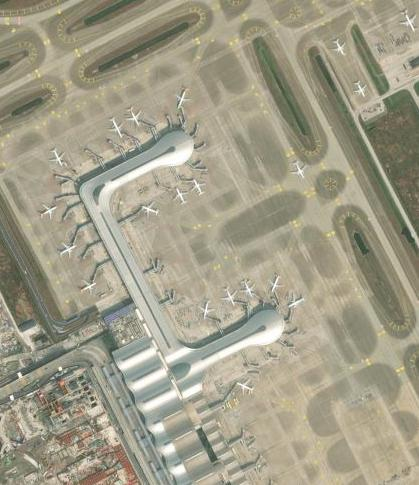

In [13]:
import os
output_images = [os.path.join(download_folder, x) for x in os.listdir(download_folder) if x[-4:] == "jpeg"]
from IPython.display import Image
import random
random_number = random.randint(0, (len(output_images)-1))
Image(output_images[random_number]) 

In [14]:
sr_outputfolder='demo/aerialsr/0812'

In [18]:
from super_resolution import REenhance
# when using CPU(no CUDA/mps), set fp32 = True
REenhance(
    input=download_folder,
    output=sr_outputfolder,
    model=1,
    out_scale=4,
    fp32 = True)

Upsampling aerialimg_lv16_0812-1425 , total number of file(s): 1
Finshed, enhanced image(s) saved in demo/SRoutputs/0812


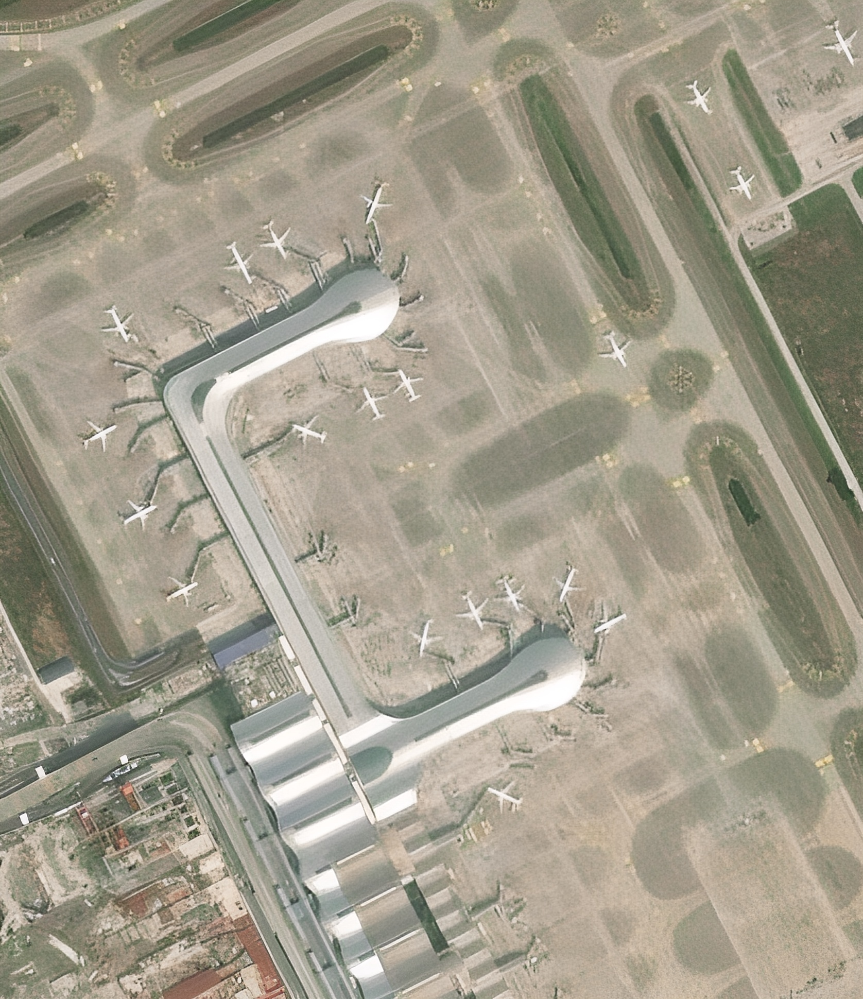

In [19]:
import os
sr_output_images = [os.path.join(sr_outputfolder, x) for x in os.listdir(sr_outputfolder) if x[-4:] == "jpeg"]
from IPython.display import Image
import random
random_number = random.randint(0, (len(sr_output_images)-1))
Image(sr_output_images[random_number]) 

In [ ]:
#!pip install sahi
#!pip install yolov5

In [1]:
from sahi.model import Yolov5DetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

In [4]:
yolov5_model_path = 'models/demo/plane_yolov5.pt'

In [5]:
detection_model = Yolov5DetectionModel(
    model_path=yolov5_model_path,
    confidence_threshold=0.25,
    device="cpu", # or 'cuda:0'
)

In [6]:
export_dir='demo/small_object_detection/detect'

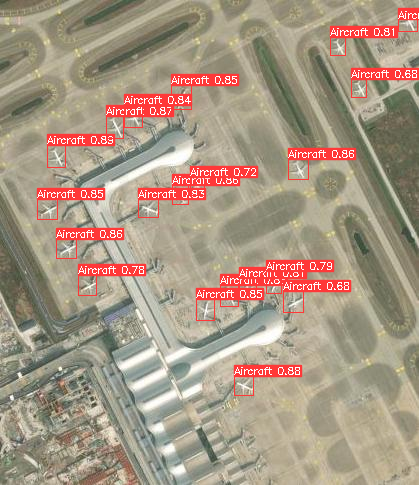

In [15]:
result = get_prediction(read_image(output_images[0]), detection_model)
result.export_visuals(export_dir=export_dir,file_name='od1_straight')
Image(export_dir+'/od1_straight.png')

08/12/2022 14:53:55 - WARNING - sahi.slicing -   Starting from version `0.10.2`, `auto_slice_resolution=True` is introduced as the default behavior for determining slice height and width automatically calculated by the image properties (resolution, aspect ratio and orientation).
Starting from version `0.10.2`, `auto_slice_resolution=True` is introduced as the default behavior for determining slice height and width automatically calculated by the image properties (resolution, aspect ratio and orientation).


Performing prediction on 1 number of slices.


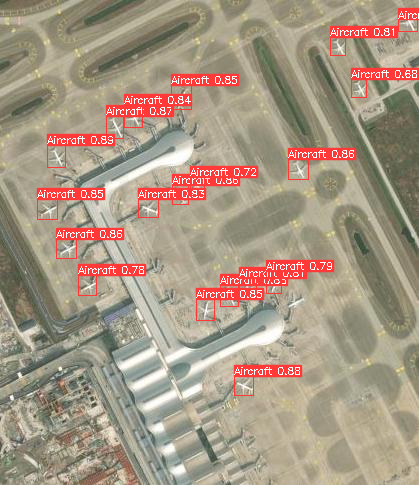

In [22]:
result = get_sliced_prediction(
    output_images[0],
    detection_model,
    auto_slice_resolution=True,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2
)
result.export_visuals(export_dir=export_dir, file_name='od1_sliced')
Image(export_dir+'/'+'od1_sliced'+'.png')

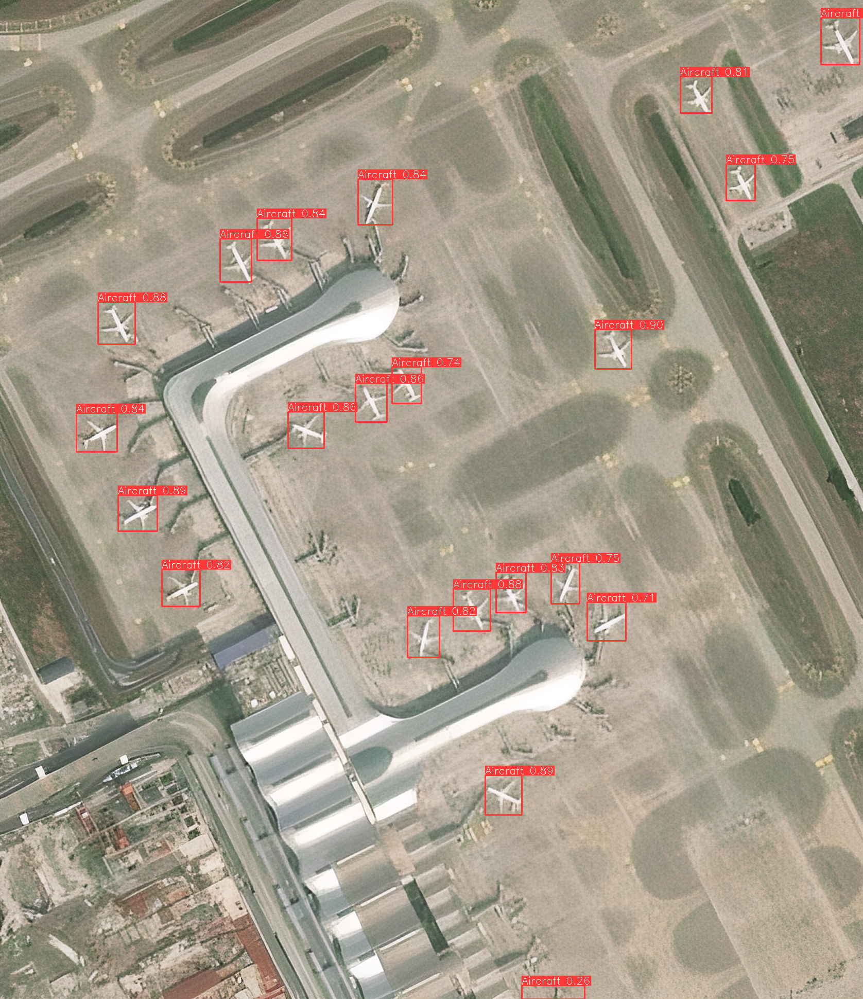

In [20]:
result = get_prediction(read_image(sr_output_images[0]), detection_model)
result.export_visuals(export_dir=export_dir, file_name='od1_enhanced')
Image(export_dir+'/'+'od1_enhanced'+'.png')

08/12/2022 14:53:15 - WARNING - sahi.slicing -   Starting from version `0.10.2`, `auto_slice_resolution=True` is introduced as the default behavior for determining slice height and width automatically calculated by the image properties (resolution, aspect ratio and orientation).
Starting from version `0.10.2`, `auto_slice_resolution=True` is introduced as the default behavior for determining slice height and width automatically calculated by the image properties (resolution, aspect ratio and orientation).


Performing prediction on 18 number of slices.


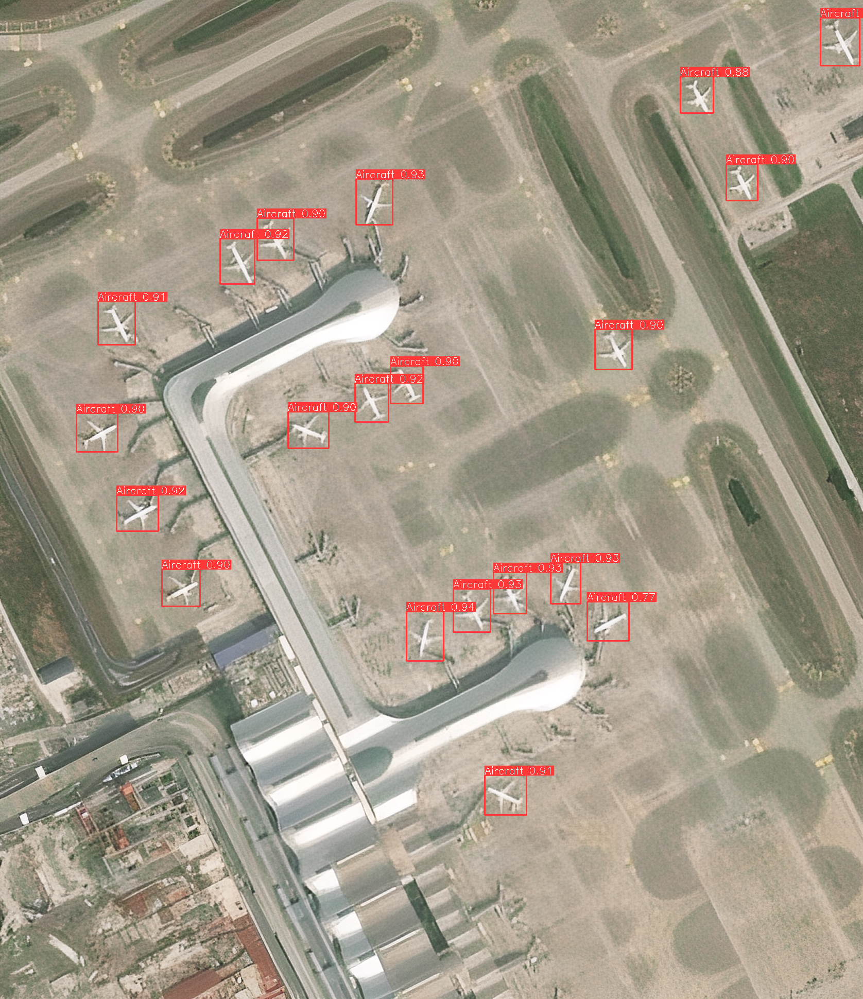

In [21]:
result = get_sliced_prediction(
    sr_output_images[0],
    detection_model,
    auto_slice_resolution=True,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2
)
result.export_visuals(export_dir=export_dir, file_name='od1_enhanced_sliced')
Image(export_dir+'/'+'od1_enhanced_sliced'+'.png')